# Packages

In [2]:
%%capture
%load_ext autoreload
%autoreload 2

from polartoolkit import fetch, maps, regions
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from osgeo import gdal
from osgeo import osr
import xarray as xr
from scipy.io import loadmat
import pygmt
import cartopy
import cartopy.crs as ccrs
import os

# Import data

In [3]:
ice_thickness = fetch.bedmap2(
    layer="thickness",  # choose which layer to plot (e.g. 'surface', 'bed', 'icebase')
    region = (1500000,2500000,-1250000,-750000)  # choose a pre-defined region, or set your own # 3) define your own region, in meters e, w, n, s in EPSG:3031
    # fill_nans=True,  # fill no data values with 0
)

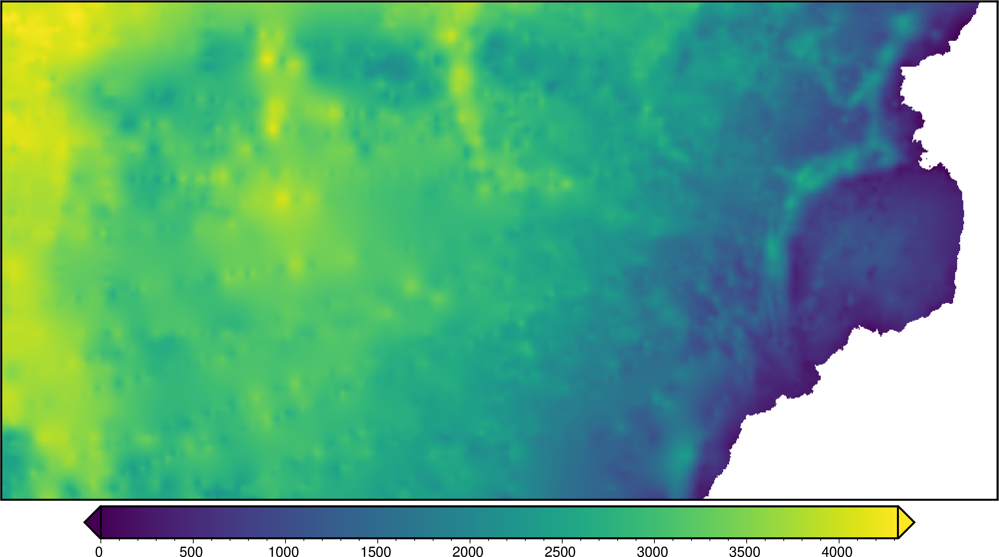

In [4]:
fig = maps.plot_grd(ice_thickness)

fig.show()

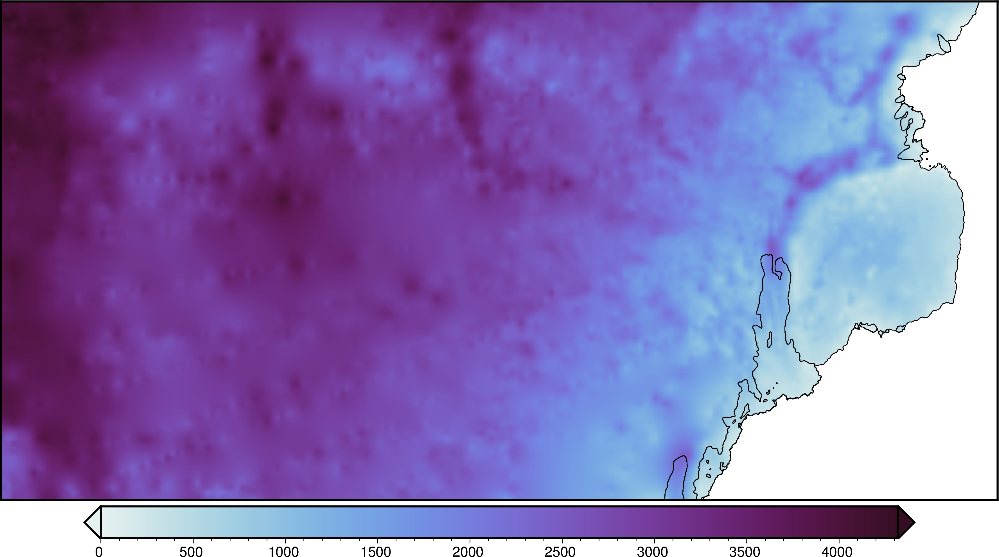

In [5]:
fig = maps.plot_grd(
    ice_thickness,
    cmap="dense",
)

# add the coastline and groundingline
maps.add_coast(fig)

fig.show()

# Build figure

grd2cpt [ERROR]: Making a continuous cpt from a discrete cpt may give unexpected results!
gmtset [WARNING]: Representation of font type not recognized. Using default.


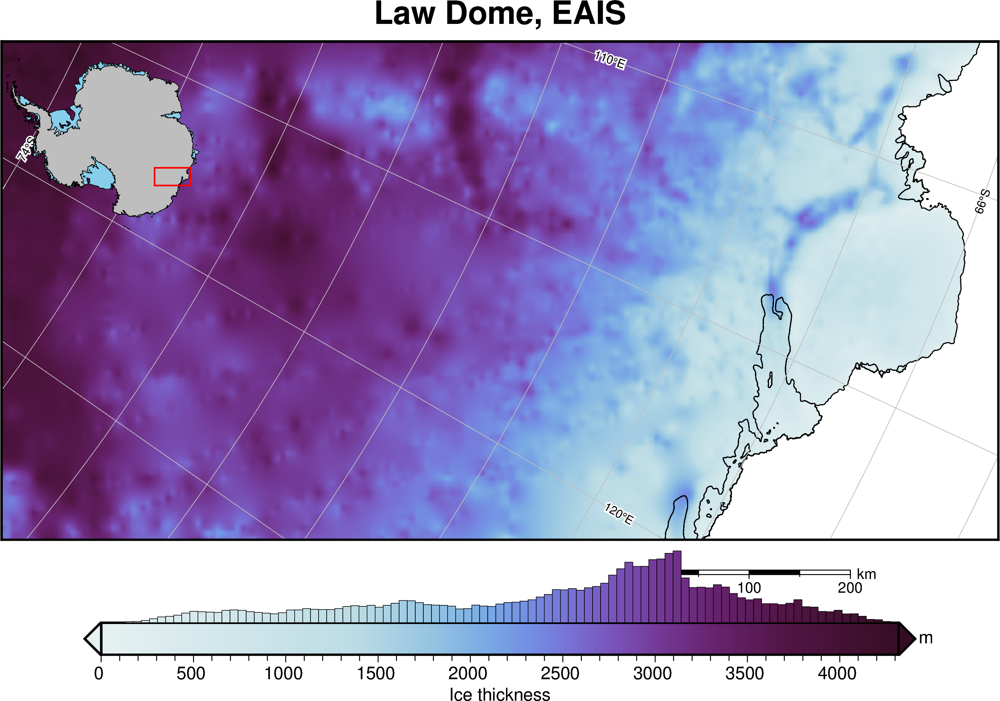

In [6]:
fig = maps.plot_grd(
    ice_thickness,
    fig_height=12,  # set figure height
    cmap="dense",  # set the colormap
    grd2cpt=True,  #
    coast=True,  # plot grounding and coastlines
    title="Law Dome, EAIS",
    cbar_label="Ice thickness",  # add label to colorbar
    cbar_unit="m",  # add units to y-axis of colorbar
    inset=True,  #  add inset map showing location
    inset_width=0.2,
    scalebar=True,  # add scalebar
    scale_position="n.75/-.07",
    gridlines=True,  # add lat/lon gridlines
    x_spacing=10,  # longitude interval (degrees)
    y_spacing=2,  # latitude interval (degrees)
    hist=True,  # add a histogram to the colorbar
    hist_bin_num=100,  # 100 bins
)

# display the figure
fig.show()

# Plot flightlines

### Import coordinates from .txt files

In [7]:
# Get the directory path containing the files
folder_path = r"C:\Users\indir\Python\DAES\data_assessment\flightlines"

# Initialize lists to store x, y values for each file
x1_values = []
y1_values = []

# repeat over each file in the folder (loop)
for filename in os.listdir(folder_path):
    if filename.endswith(".txt"):  # text files only
        file_path = os.path.join(folder_path, filename)  # Construct the full file path
        with open(file_path) as f:
            lines = f.readlines()
            x1 = [float(line.split(",")[0]) for line in lines] #0 gives x in polar stereographic, 2 in lat
            y1 = [float(line.split(",")[1]) for line in lines] #1 gives y in polar stereographic, 3 in lon
            x1_values.append(x1)  # Store the x1 values for this file
            y1_values.append(y1) #store the y1 values for this file

# x1_values and y1_values now contains a list of lists, where each sublist contains the x1/y1 values for a file



#### Check coordinates

In [8]:
x1_values

[[2462129.0,
  2462110.0,
  2462091.0,
  2462071.0,
  2462052.0,
  2462033.0,
  2462014.0,
  2461994.0,
  2461975.0,
  2461955.0,
  2461936.0,
  2461916.0,
  2461896.0,
  2461877.0,
  2461857.0,
  2461838.0,
  2461818.0,
  2461799.0,
  2461779.0,
  2461759.0,
  2461741.0,
  2461720.0,
  2461702.0,
  2461682.0,
  2461662.0,
  2461643.0,
  2461622.0,
  2461603.0,
  2461583.0,
  2461564.0,
  2461544.0,
  2461524.0,
  2461504.0,
  2461485.0,
  2461464.0,
  2461445.0,
  2461426.0,
  2461405.0,
  2461386.0,
  2461366.0,
  2461346.0,
  2461325.0,
  2461306.0,
  2461286.0,
  2461265.0,
  2461246.0,
  2461227.0,
  2461206.0,
  2461186.0,
  2461166.0,
  2461146.0,
  2461126.0,
  2461106.0,
  2461086.0,
  2461066.0,
  2461046.0,
  2461026.0,
  2461006.0,
  2460986.0,
  2460964.0,
  2460945.0,
  2460925.0,
  2460905.0,
  2460885.0,
  2460863.0,
  2460844.0,
  2460824.0,
  2460804.0,
  2460783.0,
  2460763.0,
  2460742.0,
  2460722.0,
  2460702.0,
  2460680.0,
  2460660.0,
  2460640.0,
  2460619.0,

In [9]:
y1_values

[[-979454.4,
  -979460.2,
  -979465.8,
  -979471.4,
  -979477.2,
  -979482.7,
  -979488.4,
  -979493.5,
  -979499.2,
  -979504.3,
  -979509.3,
  -979514.6,
  -979519.8,
  -979525.3,
  -979530.0,
  -979535.6,
  -979540.4,
  -979545.2,
  -979550.6,
  -979555.2,
  -979560.6,
  -979565.4,
  -979570.4,
  -979574.9,
  -979579.4,
  -979584.6,
  -979589.1,
  -979593.3,
  -979598.2,
  -979603.0,
  -979607.4,
  -979611.9,
  -979616.8,
  -979621.3,
  -979625.2,
  -979629.7,
  -979634.6,
  -979638.6,
  -979642.9,
  -979647.2,
  -979651.7,
  -979656.3,
  -979660.1,
  -979664.1,
  -979668.4,
  -979672.4,
  -979676.9,
  -979681.1,
  -979684.9,
  -979689.1,
  -979692.9,
  -979696.8,
  -979701.4,
  -979704.7,
  -979708.7,
  -979712.6,
  -979716.3,
  -979719.9,
  -979723.8,
  -979726.8,
  -979730.8,
  -979734.1,
  -979737.8,
  -979740.9,
  -979744.2,
  -979747.4,
  -979751.1,
  -979754.4,
  -979757.6,
  -979760.4,
  -979763.2,
  -979766.5,
  -979769.9,
  -979772.6,
  -979775.2,
  -979778.4,
  -979780.8,

### Plot onto map

grd2cpt [ERROR]: Making a continuous cpt from a discrete cpt may give unexpected results!
gmtset [WARNING]: Representation of font type not recognized. Using default.


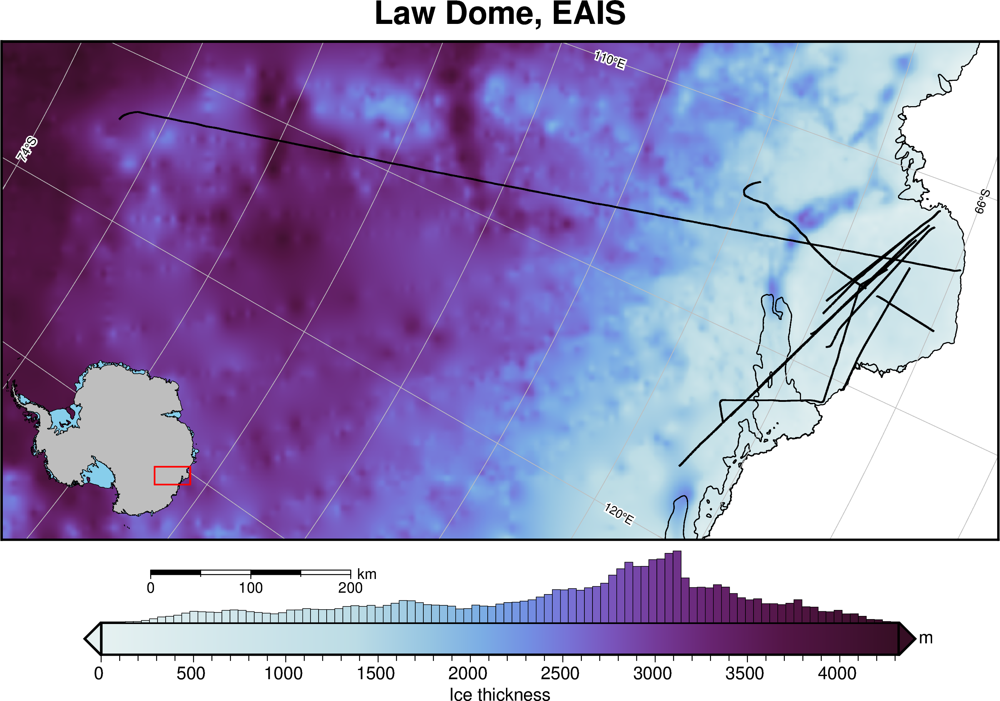

In [32]:
fig = maps.plot_grd(
    ice_thickness,
    fig_height=12,  # set figure height
    cmap="dense",  # set the colormap
    grd2cpt=True,  #
    coast=True,  # plot grounding and coastlines
    title="Law Dome, EAIS",
    cbar_label="Ice thickness",  # add label to colorbar
    cbar_unit="m",  # add units to y-axis of colorbar
    inset=True,  #  add inset map showing location
    inset_width=0.2,
    inset_pos='BL', # inset map position
    scalebar=True,  # add scalebar
    scale_position="n.25/-.07",
    gridlines=True,  # add lat/lon gridlines
    x_spacing=10,  # longitude interval (degrees)
    y_spacing=2,  # latitude interval (degrees)
    hist=True,  # add a histogram to the colorbar
    hist_bin_num=100,  # 100 bins
)

# add flightlines
for x, y in zip(x1_values, y1_values):
    fig.plot(x=x, y=y, pen="1p,black")
    fig.text(x=115, y=-60, text="ICECAP Flightlines", offset="0c/.5c")
    
# Show the figure
fig.show()

In [33]:
# saves a pdf version of the plot
fig.savefig('bedmap_icethickness.pdf',dpi=300)
# saves a PNG version of the plot
fig.savefig('bedmap_icethickness.png',dpi=300)

# Sat Imagery Version

# Packages

In [15]:
from polartoolkit import fetch, maps

# source imagery

In [16]:
imagery = fetch.imagery()

surface = fetch.bedmap2(layer="surface")

# build figure

gmtset [WARNING]: Representation of font type not recognized. Using default.


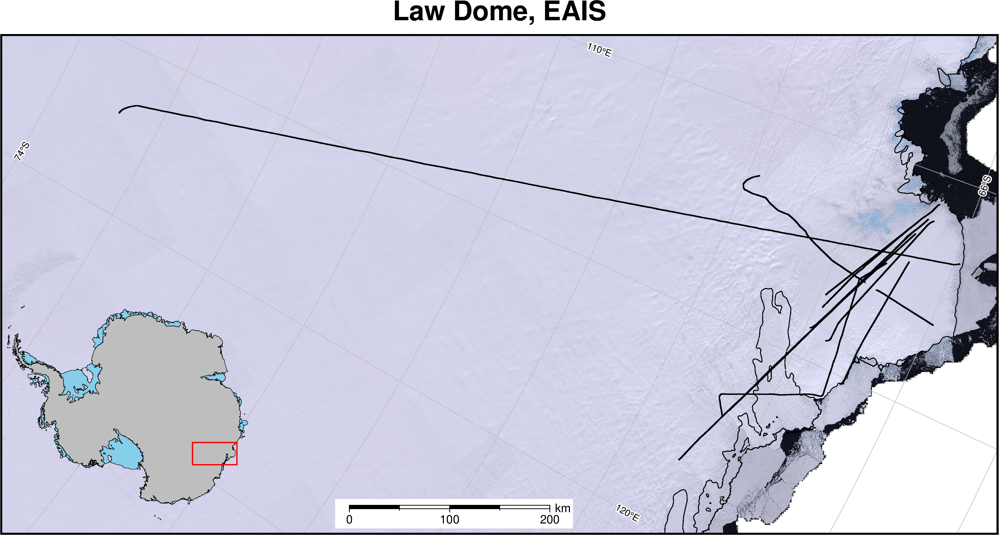

In [29]:
# define region
region = (1500000,2500000,-1250000,-750000)  # choose a pre-defined region, or set your own # 3) define your own region, in meters e, w, n, s in EPSG:3031
    # fill_nans=True,  # fill no data values with 0

# plot imagery and map features
fig = maps.plot_grd(
    imagery,
    region=region,
    image=True,
    inset=True,
    inset_pos='BL', # inset map position
    scalebar=True,  # add scalebar
    scale_position="n.45/+0.05",
    coast=True,  # plot grounding and coastlines
    title="Law Dome, EAIS",
    gridlines=True,
    x_spacing=10,  # plot 10 degree longitude lines
    y_spacing=2,  # plot 2 degree latitude lines
)

# add flightlines
for x, y in zip(x1_values, y1_values):
    fig.plot(x=x, y=y, pen="1p,black")
    
# Show the figure
fig.show()

In [30]:
# saves a pdf version of the plot
fig.savefig('Lima_imagery.pdf',dpi=300)
# saves a PNG version of the plot
fig.savefig('Lima_imagery.png',dpi=300)